# Анализ рынка заведений общественного питания Москвы

**Задача:** провести исследование рынка общественного питания Москвы на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года (в данных присутствует информация, добавленная пользователями или найдена в общедоступных источниках).

**Цель:**
1. Изучить основные особенности рынка заведений общественного питания Москвы, а именно: 
    - определить наиболее популярные категории заведений;
    - рассмотреть соотношение сетевых и несетевых заведений, определить наиболее распространенные сети общепита (топ-15);
    - изучить расположение заведений (в разбивке по категориям) по районам Москвы;
    - проанализировать средний рейтинг заведений;
    - изучить средние чеки по районам;;
2. Сформировать рекомендации для заказчика по открытию кофейни (в т.ч. определить тип заведения, потенциальное расположение и ценовую политику).

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Изучение-датасета" data-toc-modified-id="Изучение-датасета-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Изучение датасета</a></span></li><li><span><a href="#Предобработка" data-toc-modified-id="Предобработка-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ данных</a></span><ul class="toc-item"><li><span><a href="#Категории-заведений" data-toc-modified-id="Категории-заведений-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Категории заведений</a></span></li><li><span><a href="#Категории-в-разрезе-по-количеству-посадочных-мест" data-toc-modified-id="Категории-в-разрезе-по-количеству-посадочных-мест-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Категории в разрезе по количеству посадочных мест</a></span></li><li><span><a href="#Сетевые-и-несетевые-заведения" data-toc-modified-id="Сетевые-и-несетевые-заведения-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Сетевые и несетевые заведения</a></span></li><li><span><a href="#Заведения-на-карте" data-toc-modified-id="Заведения-на-карте-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Заведения на карте</a></span><ul class="toc-item"><li><span><a href="#Заведения-по-районам-Москвы" data-toc-modified-id="Заведения-по-районам-Москвы-3.4.1"><span class="toc-item-num">3.4.1&nbsp;&nbsp;</span>Заведения по районам Москвы</a></span></li><li><span><a href="#Рейтинг" data-toc-modified-id="Рейтинг-3.4.2"><span class="toc-item-num">3.4.2&nbsp;&nbsp;</span>Рейтинг</a></span></li><li><span><a href="#Все-заведения-на-карте" data-toc-modified-id="Все-заведения-на-карте-3.4.3"><span class="toc-item-num">3.4.3&nbsp;&nbsp;</span>Все заведения на карте</a></span></li><li><span><a href="#Топ-15-улиц-по-количеству-заведений" data-toc-modified-id="Топ-15-улиц-по-количеству-заведений-3.4.4"><span class="toc-item-num">3.4.4&nbsp;&nbsp;</span>Топ-15 улиц по количеству заведений</a></span></li><li><span><a href="#Средний-чек-по-районам" data-toc-modified-id="Средний-чек-по-районам-3.4.5"><span class="toc-item-num">3.4.5&nbsp;&nbsp;</span>Средний чек по районам</a></span></li></ul></li></ul></li><li><span><a href="#Детализация.-Открытие-кофейни" data-toc-modified-id="Детализация.-Открытие-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Детализация. Открытие кофейни</a></span><ul class="toc-item"><li><span><a href="#Расположение" data-toc-modified-id="Расположение-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Расположение</a></span></li><li><span><a href="#Режим-работы-и-формат-заведения" data-toc-modified-id="Режим-работы-и-формат-заведения-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Режим работы и формат заведения</a></span></li><li><span><a href="#Рейтинг" data-toc-modified-id="Рейтинг-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Рейтинг</a></span></li><li><span><a href="#Цена-чашки-кофе" data-toc-modified-id="Цена-чашки-кофе-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Цена чашки кофе</a></span></li><li><span><a href="#Рекомендации-по-открытию-кофейни" data-toc-modified-id="Рекомендации-по-открытию-кофейни-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Рекомендации по открытию кофейни</a></span></li></ul></li></ul></div>

## Изучение датасета

In [1]:
!pip install folium

In [2]:
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import json

In [3]:
df = pd.read_csv('/datasets/moscow_places.csv')

Т.к. информация о заведениях общепита добавляется пользователями, то сначала необходимо провести предобработку данных (проверить наличие ошибок, пропусков и дубликатов). Изучим датасет:

In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датасете 8406 строк. Из 14 столбцов пропуски в данных имеются в 6 столбцах, при чем почти во всех столбцах (кроме hours) количество пропусков значимое - более 50%. В основном пропуски встречаются в столбцах с ценами, восстановить эти данные невозможно, но можно попробовать поискать значения в одном из столбцов, которые позволят восстановить данные в другом.

Данные с кол-вом посадочных мест восстановить не возможно.

Тип данных в столбце chain - целочисленный, содержит значения 1 либо 0. В остальных столбцах данные либо текстовые (тип object), либо вещественные числа (тип float).

Для удобства дальнейшего анализа заполним пропуски в столбце с часами работы значением "неизвестно". Восстановить такие данные без больших трудозатрат не представляется возможным, а добавленное значение не исказит имеющиеся данные.

In [6]:
df['hours'] = df['hours'].fillna('неизвестно')

In [7]:
df['name'] = df['name'].str.lower()

In [8]:
print(f'В датасете представлено', df['name'].nunique(), 'заведений')

В датасете представлено 5512 заведений


In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,8406.0,55.750109,0.069658,55.573942,55.705155,55.753425,55.795041,55.928943
lng,8406.0,37.608570,0.098597,37.355651,37.538583,37.605246,37.664792,37.874466
rating,8406.0,4.229895,0.470348,1.000000,4.100000,4.300000,4.400000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,375.000000,750.000000,1250.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,124.500000,169.000000,225.000000,1568.000000
chain,8406.0,0.381275,0.485729,0.000000,0.000000,0.000000,1.000000,1.000000
seats,4795.0,108.421689,122.833396,0.000000,40.000000,75.000000,140.000000,1288.000000


Минимальное значение в столбцах со средним счетом и кол-вом посадочных мест выглядит странно, в остальных столбцах с минимальными значениями проблем нет. Значения рейтинга корректны. Широта и долгота (55 и 37) совпадают с Московской, дополнительно можно проверить, что в датасете данные только по г. Москва (т.е. проверить, что в столбце адрес первый элемент это Москва).

In [10]:
df['address'].apply(lambda x: re.split(pattern=', ', string=x)[0]).unique()

array(['Москва'], dtype=object)

В столбцах со средним счетом, средней ценой чашки кофе и кол-вом посадочных места можно увидеть аномальные выбросы - изучим значения в этих столбцах подробнее.

Посмотрим как распределены значения в столбце со средним счетом.

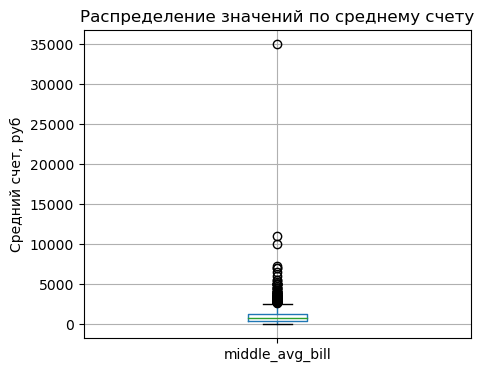

In [11]:
df.boxplot(column='middle_avg_bill', figsize=(5,4))
plt.ylabel('Средний счет, руб')
plt.title('Распределение значений по среднему счету')
plt.show();

In [12]:
df.query('middle_avg_bill >= 10000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


Судя по названиям и расположению мест (кроме ресторана Гости) в среднем ценнике явно ошибка, возможно корректное значение можно получить разделив на 10 или 100, но т.к. данные по категории, рейтингу и кол-ву посадочных мест выглядят сомнительно, то просто удалим эти строки.

In [13]:
df = df.drop([730, 7177]).reset_index(drop=True)

In [14]:
df.query('middle_avg_bill == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3687,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


Значение среднего счета похоже на ошибку. Т.к. это сетевое заведение, можно заполнить данные наиболее частым значением для этой сети.

In [15]:
df.loc[3687, 'avg_bill'] = df.query('name == "кофемания"')['avg_bill'].mode()[0]
df.loc[3687, 'middle_avg_bill'] = df.query('name == "кофемания"')['middle_avg_bill'].mode()[0]

Также заполним пропуски в среднем чеке других заведений этой сети

In [16]:
df.loc[df['name'] == 'кофемания', 'avg_bill'] = df.loc[df['name'] == 'кофемания', 'avg_bill'] \
                                            .fillna(df.query('name == "кофемания"')['avg_bill'].mode()[0])
df.loc[df['name'] == 'кофемания', 'middle_avg_bill'] = df.loc[df['name'] == 'кофемания', 'middle_avg_bill'] \
                                                .fillna(df.query('name == "кофемания"')['middle_avg_bill'].mode()[0])

Теперь изучим значения в столбце со средней ценой чашки кофе:

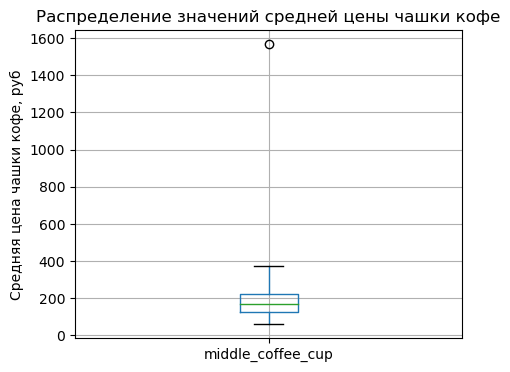

In [17]:
df.boxplot(column='middle_coffee_cup', figsize=(5,4))
plt.title('Распределение значений средней цены чашки кофе')
plt.ylabel('Средняя цена чашки кофе, руб')
plt.show();

In [18]:
df[df['middle_coffee_cup'] > 1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2858,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Тут явно опечатка, цена чашки от 230 до 290 руб, исправим это вручную.

In [19]:
df.loc[2858, 'avg_bill'] = 'Цена чашки капучино:230-290 ₽'
df.loc[2858, 'middle_coffee_cup'] = (230+290)/2

Теперь посмотрим значения по кол-ву посадочных мест.

In [20]:
len(df.query('seats == 0'))

136

In [21]:
df.query('seats == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,meat doner kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
177,арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
196,донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
203,тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0
211,неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8116,бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,NaN,NaN,NaN,NaN,0,0.0
8166,чайхана уч кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,NaN,NaN,NaN,NaN,0,0.0
8170,масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,NaN,155.0,0,0.0
8334,сочная шаурма в кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,NaN,Средний счёт:120–130 ₽,125.0,NaN,0,0.0


Таких заведений немного (около 2%), скорее всего это заведения с едой/кофе на вынос, либо фудкорт. Не будем считать это значение ошибкой. 

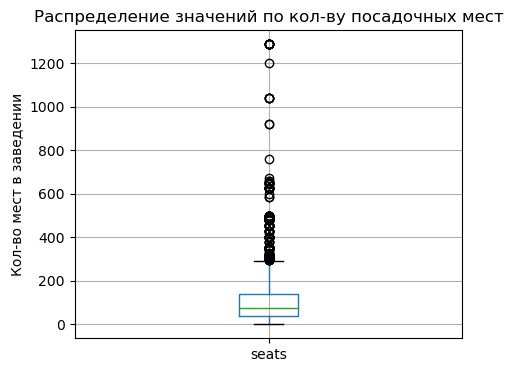

In [22]:
df.boxplot(column='seats', figsize=(5,4))
plt.title('Распределение значений по кол-ву посадочных мест')
plt.ylabel('Кол-во мест в заведении')
plt.show();

In [23]:
df.query('seats > 700')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2712,ваня и гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0
2721,маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0
2769,шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0
2965,матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,неизвестно,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0
4179,eataly,"бар,паб","Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 12:00–23:00",55.743405,37.562535,4.6,NaN,NaN,NaN,NaN,0,920.0
4230,рестобар argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0
4244,стейк & бургер,кафе,"Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 09:00–21:00",55.742953,37.561872,4.2,NaN,NaN,NaN,NaN,1,920.0
5485,дом,кафе,"Москва, улица Юности, 1",Восточный административный округ,неизвестно,55.736204,37.815500,4.9,NaN,NaN,NaN,NaN,0,760.0
6517,delonixcafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6523,ян примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0


Можно заметить, что аномально большое кол-во посадочных мест встречается у заведений, расположенных на одной улице или даже по одному адресу. Можно было бы сделать предположение, что эти кафе расположены в формате "фудкорт", но, например, шоколадница как правило имеет свой отдельный зал. Более 700 посадочных мест может быть только у больших площадкок (для банкета, например), поэтому будем считать, что в данных опечатка и все значения больше 700 необходимо разделить на 10.

In [24]:
df.loc[df['seats'] > 700, ['seats']] = round(df.loc[df['seats'] > 700, ['seats']]/10)

Посмотрим можно ли восстановить какие-либо данные в столбцах с ценами.

In [25]:
len(df[(df['avg_bill'] != "NaN") & (df['avg_bill'].str.contains("Цена чашки")) & (df['middle_coffee_cup'] == "NaN")])

0

In [26]:
len(df[(df['avg_bill'] != "NaN") & (df['avg_bill'].str.contains("Средний")) & (df['middle_avg_bill'] == "NaN")])

0

В ценовых столбцах нет данных, которые бы позволили заполнить столбцы со средними ценами.

Посмотрим как распределены значения среднего чека по категориям цен в заведениях

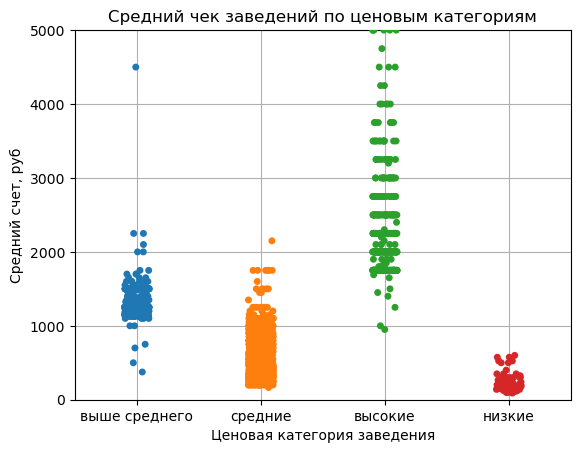

In [27]:
sns.stripplot(x='price', y='middle_avg_bill', data=df)
plt.grid()
plt.ylim(0, 5000)
plt.ylabel('Средний счет, руб')
plt.xlabel('Ценовая категория заведения')
plt.title('Средний чек заведений по ценовым категориям')
plt.show();

Диапазоны ценовых категорий строго не заданы, поэтому есть области пересечения, а также ошибки в соотнесении среднего чека и ценовой категории заведения. Можно рекомендовать доработать форму заоплнения данных о заведении таким образом, чтобы ценовая категория определялась автоматически на основе оценки среднего чека.

В целом можно перезадать категории, но данные не будут исследоваться в таком разрезе, поэтому пока оставим как есть.

## Предобработка

Изучим датасет на наличие дубликатов. Попробуем найти полные дубли, а также дубли по названию и адресу.

In [28]:
df.duplicated().sum()

0

In [29]:
df.duplicated(subset=['name', 'address']).sum()

3

In [30]:
df[df.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1429,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1510,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2210,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2419,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3090,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3108,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,неизвестно,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [31]:
df = df.drop([1429, 2210, 3108]).reset_index(drop=True)

In [32]:
df[df.duplicated(subset=['address', 'lat', 'lng'], keep=False)].sort_values(by='address')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1070,кафе,быстрое питание,"Москва, Анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,неизвестно,55.863555,37.682835,3.7,NaN,NaN,NaN,NaN,0,100.0
1073,халяль кафе-пекарня,булочная,"Москва, Анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.863555,37.682835,3.7,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,100.0
7762,за обе щёки,кафе,"Москва, Варшавское шоссе, вл132/2",Южный административный округ,"ежедневно, 09:00–21:00",55.620316,37.608922,3.6,NaN,NaN,NaN,NaN,1,NaN
7655,100лоффка,столовая,"Москва, Варшавское шоссе, вл132/2",Южный административный округ,пн-пт 09:00–17:30,55.620316,37.608922,4.4,низкие,Средний счёт:100–270 ₽,185.0,NaN,0,NaN
348,meat лав,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,Средний счёт:300–600 ₽,450.0,NaN,0,NaN
662,family cafe mayak,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,NaN
121,встреча,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN
182,карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN
2998,хинкальная,кафе,"Москва, Краснобогатырская улица, 79",Восточный административный округ,"ежедневно, 09:00–00:00",55.805361,37.708967,4.1,NaN,NaN,NaN,NaN,1,NaN
2936,прошу к столу,булочная,"Москва, Краснобогатырская улица, 79",Восточный административный округ,"ежедневно, 10:00–21:00",55.805361,37.708967,3.8,средние,Средний счёт:300 ₽,300.0,NaN,0,NaN


Есть неявные дубли - сикварули, а также leon/леон. Для первого случая оставим строку, где название указано без категории заведения, а во втором, посмотрим какое написание в датасете встречается чаще.

In [33]:
df.query('name == "leon" or name == "леон"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1052,leon,ресторан,"Москва, проспект Мира, 119, стр. 10",Северо-Восточный административный округ,"вт-пт 12:00–20:00; сб,вс 12:00–22:00",55.829632,37.629695,4.0,NaN,NaN,NaN,NaN,1,NaN
5310,leon,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.3,NaN,NaN,NaN,NaN,1,NaN
5312,леон,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.4,NaN,NaN,NaN,NaN,0,NaN


In [34]:
df = df.drop([1323, 5312]).reset_index(drop=True)

In [35]:
df.loc[df['name'] == 'яндекс.лавка', 'name'] = 'яндекс лавка'

Проверим сколько заведений и какие ошибочно отнесены к сетевым и наоборот. Ошибкой можно считать следующие два случая:
- если кол-во заведений не совпадает с кол-вом при суммировании chain (т.е. некоторые из заведений сети не отмечены как сетевые);
- если по названию существует только одно заведение, но указано, что это сеть (т.е. chain = 1 или больше, т.к. True при суммировании считается за единицу).

In [36]:
errors = df.groupby('name', as_index=False).agg({'address': 'count', 'chain': 'sum'})

In [37]:
print('Сетевые места, в которых есть попуски по маркеру сети:',
      len(errors[(errors['address'] > 1) & (errors['address'] != errors['chain'])]))

Сетевые места, в которых есть попуски по маркеру сети: 99


In [38]:
errors[(errors['address'] > 1) & (errors['address'] != errors['chain'])]

,name,address,chain
51,abc coffee roasters,5,4
135,bb grill,2,0
246,burger club,6,5
294,carrots and beans,2,0
376,coffee point,3,2
...,...,...,...
5327,шаурма в пите,4,3
5358,шашлык на углях,2,0
5361,шашлык хаус,3,2
5371,шашлычная,6,0


Почти 100 заведений (напомним, что всего их ~5100) имеют ошибки (т.е. менее 2%). Но при этом заменять все значения на "сетевые" для выведенных выше мест будет ошибкой, т.к. название может повторяться даже есть заведение не сетевое (пример - шашлычная, шашлык на углях). Отделять названия, которые не могут быть сетевыми слишком трудозатратно.

In [39]:
print('Заведений, ошибочно отнесенных к сетевым:', len(errors[(errors['address'] == 1) & (errors['chain'] > 0)]))

Заведений, ошибочно отнесенных к сетевым: 59


In [40]:
errors[(errors['address'] == 1) & (errors['chain'] > 0)]

,name,address,chain
3,1-я креветочная,1,1
25,4 сезона,1,1
118,bakery,1,1
161,bigсуши,1,1
506,drive,1,1
520,easy pizza,1,1
726,halal food,1,1
750,home,1,1
842,kimpab,1,1
1250,ploveberry,1,1


Заведений, ошибочно отнесенных к сетевым всего около 60 (т.к. ~1% от всех), но и среди них встречаются неточности (любовь и сладости - сетевое заведение, хотя адрес один, вероятно опечатки в названиях). Оставим как есть.

Выделим названия улиц в отдельный столбец, а также добавит столбец с указанием работает заведение ежедневно и круглосуточно или нет (булев тип значений).

Название улицы обычно указано на втором месте после названия города. При этом в датасете есть заведения, расположенные на МКАД - в таком случае указания только МКАД недостаточно, поэтому в колонку с названием улицы нужно будет добавить номер километра МКАД (т.е. третья позиция в адресе).

In [41]:
df['street'] = df['address'].apply(lambda x: re.split(pattern=', ', string=x)[1])

In [42]:
df.loc[df['street'] == 'МКАД', 'street'] += df.loc[
                                            df['street'] == 'МКАД', 'address'
                                            ].apply(lambda x: re.split(pattern=',', string=x)[2]) 

In [43]:
df['is_24/7'] = np.where(
                        df['hours'].str.contains('ежедневно') & df['hours'].str.contains('круглосуточно'), 
                           True, 
                           False)

In [44]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

### Категории заведений
Рассмотрим прдеставленные заведения в датасете в разрезе категорий.

In [45]:
print('В датасете представлены заведения следующих категорий:')
df['category'].unique()

В датасете представлены заведения следующих категорий:


array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

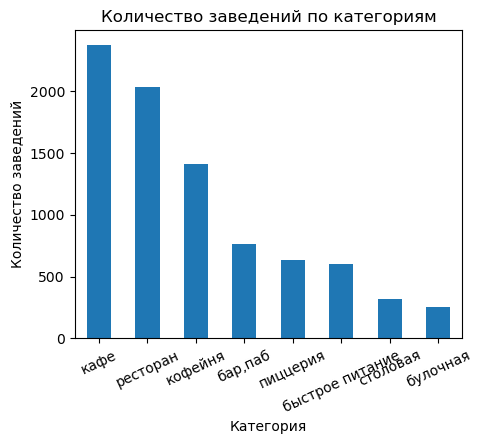

In [46]:
(
    df.groupby('category', as_index=False).agg(count=('category', 'count'))
    .sort_values(by='count', ascending=False).plot(kind='bar', x='category', y='count', legend=False, figsize=(5,4))
)
plt.title('Количество заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.xticks(rotation=25)
plt.show();

<div style="border:solid blue 1px; padding: 10px"> В Москве больше всего заведений категории кафе (около 2,5 тыс.). На втором месте по количеству - рестораны (~ 2 тыс.); на третьем - кофейни (менее 1,5 тыс.). У таких категорий заведений наибольший уровень конкуренции, но при этом и больше разнообразия при выборе кухни и меню (пиццерии ограничены только пиццей, а в барах и пабах больше упор на напитки).

Меньше всего представлено булочных и столовых (около 250 в каждой из категорий).</div>

### Категории в разрезе по количеству посадочных мест
Исследуем категории заведений с точки зрения количества посадочных мест.

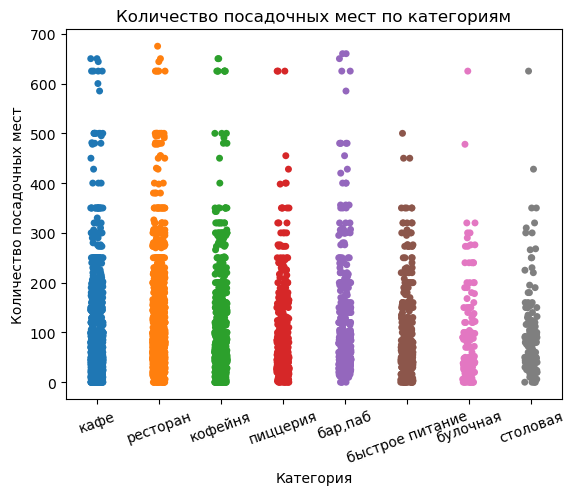

In [47]:
sns.stripplot(x='category', y='seats', data=df)
plt.title('Количество посадочных мест по категориям')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория')
plt.xticks(rotation=20)
plt.show();

В целом в каждой из категорий встречаются заведения с количество посадочных мест от 0 до 300 - это наиболее распространенные форматы. Для булочных и столовых можно наблюдать наименьший диапазон значений. Чаще всего более 300 мест имеют рестораны, кафе и бары/пабы. 

Для более детального анализа построим другой график, предварительно отсортировав категории по убыванию медианного значения.

In [48]:
sorted_index = df.groupby('category')['seats'].median().sort_values(ascending=False).index

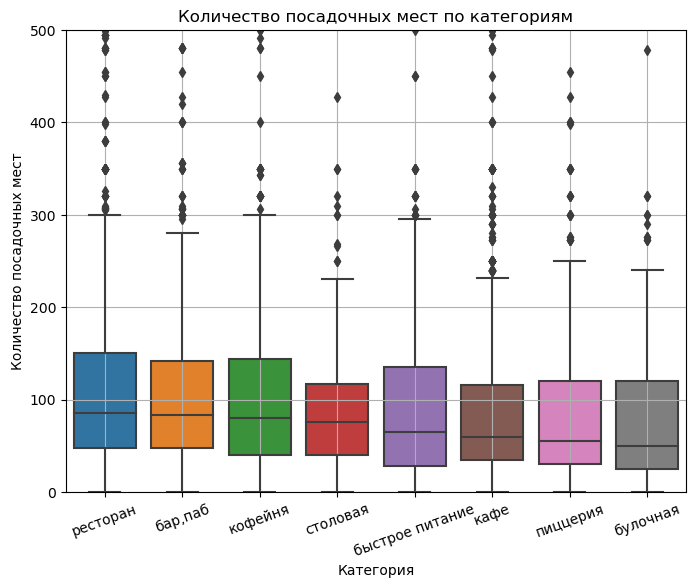

In [49]:
plt.figure(figsize=(8,6))
sns.boxplot(x=df['category'], y=df['seats'], order=sorted_index)
plt.grid()
plt.title('Количество посадочных мест по категориям')
plt.ylim(0, 500)
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория')
plt.xticks(rotation=20)
plt.show();

<div style="border:solid blue 1px; padding: 10px"> Для всех категорий медианные значения находятся в диапазоне от ~50 до 100 посадочных мест. Наибольшее медианное значение посадочных мест наблюдаем у ресторанов, баров/пабов и кофеен. Далее идут столовые - как правило они рассчитаны на массовое посещение и питание внутри заведения. Меньше всего посадочных мест у булочных и пиццерий, т.к. такой формат скорее подразумевает покупку еды на вынос или доставку. </div>

### Сетевые и несетевые заведения
Посмотрим на соотношение сетевых и несетевых заведений в датасете.

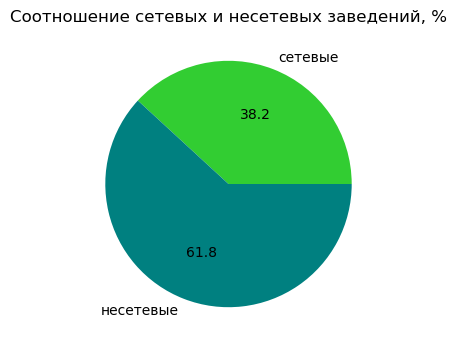

In [50]:
share_by_chain = [df['chain'].sum()/df['chain'].count(),
                  1 - df['chain'].sum()/df['chain'].count()]
plt.figure(figsize=(4,4))
plt.pie(share_by_chain, labels=['сетевые', 'несетевые'], autopct='%.1f', colors=['limegreen', 'teal'])
plt.title('Соотношение сетевых и несетевых заведений, %')
plt.show();

В датасете представлено примерно в 1,5 раза больше несетевых заведений, чем сетевых. Запуск и поддержание сети питания в Москве - капиталоемко и трудозатратно, вероятно предприниматели предпочитают открывать "одиночные" несетевые точки питания.

Исследуем какие категории заведений чаще являются сетевыми.

In [51]:
chains = df.groupby('category').agg({'category': 'count', 'chain': 'sum'})
chains['share'] = round(
                        chains['chain']/chains['category'],
                        2)
chains['share_not_chain'] = 1 - chains['share']

chains.columns = ['кол-во всего', 'кол-во сетевых', 'сетевые', 'несетевые']

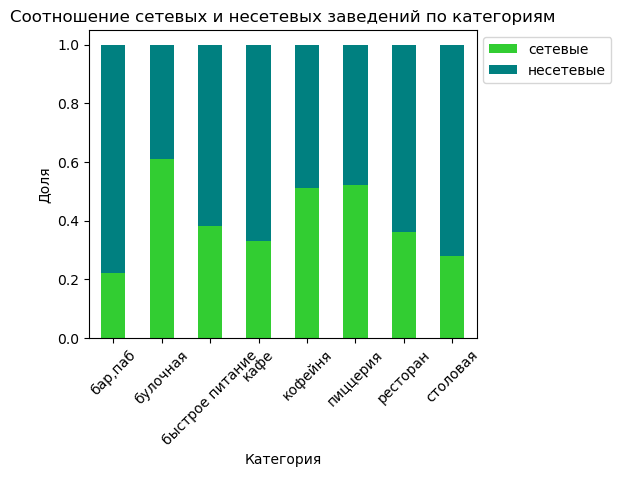

In [52]:
chains[['сетевые', 'несетевые']].plot(kind='bar', stacked= True , color=['limegreen', 'teal'], figsize=(5,4))
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.title('Соотношение сетевых и несетевых заведений по категориям')
plt.ylabel('Доля')
plt.xlabel('Категория')
plt.xticks(rotation=45)
plt.show();

<div style="border:solid blue 1px; padding: 10px"> Больше всего сетевых заведений среди булочных (60%), пиццерий и кофеен (почти половина заведений в каждой категории). Эти категории - достаточно простой и понятный формат заведения с определнной кухней и несильно разнообразным меню, что делает проще распространение франшизы. Меньше всего - среди баров/пабов и столовых. Доля сетевых заведений среди кафе и ресторанов примерно на одном уровне (чуть меньше 40%).

Конкурировать с сетевыми заведениями как правило сложнее. </div>

Определим наиболее популярные сетевые (топ-15) заведения в Москве. Под популярностью имеем ввиду количество заведений этой сети в регионе.

In [53]:
top = df[df['chain'] == True].groupby('name', 
                                      as_index=False
                                     ).agg(count=('name', 'count')).sort_values(by='count', ascending=False).head(15)

In [54]:
top_names = top['name']

Проверим есть ли ошибки - посмотрим для каждой ли из топ-15 сетей указана одна категория.

In [55]:
df.query('name in @top_names').groupby('name').agg({'category': 'nunique'})

,category
name,
cofefest,2
cofix,1
one price coffee,1
prime,2
буханка,3
додо пицца,1
домино'с пицца,1
кофепорт,1
кулинарная лавка братьев караваевых,1


У заведений из одно и той же сети встречаются различные категории - это ошибка. Для топ-15 заполним категорию заведения наиболее часто встречающимся значением.

In [56]:
for name in top['name']:
    df.loc[df['name'] == name, 'category'] = df.loc[df['name'] == name, 'category'].mode()[0]

In [57]:
top_with_category = (df.query('name in @top_names')
                     .groupby(['name', 'category'], as_index=False)
                     .agg(total=('category', 'count'))
                     .sort_values(by='total', ascending=False))

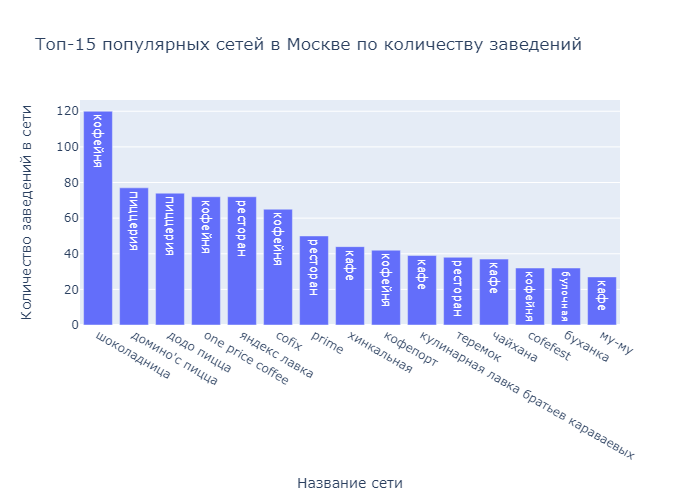

In [58]:
fig = px.bar(top_with_category, x='name', y='total', 
             title='Топ-15 популярных сетей в Москве по количеству заведений',
            text='category',  # из-за ограничений github выношу категорию в надпись на столбце
             #hover_data=['category'],
            labels={'total': 'Количество заведений в сети',
                   'name': 'Название сети',
                   'category': 'категория'})
fig.show('png');

<div style="border:solid blue 1px; padding: 10px"> 
    
В топ-15 популярных сетей вошли известные сетевые заведения в Москве, которые скорее всего обрели популярность из-за:
- доступных цен;
- привычного для большинства потребителей меню (около-домашняя кухня или быстрое питание);
- удобных услуг доставки (пицца и яндекс лавка).

Вероятно, что "хинкальная" на самом деле не является сетью и это просто заведения с одинаковыми названиями, но т.к. данные в датасете вносились обычными пользователями, то проверить все данные обработать все ошибки невозможно. В остальном все названия известны. </div>

Посмотрим какие категории встречаются чаще всего среди топ-15 самых популярных сетей питания Москвы.

In [59]:
category_share = top_with_category.groupby('category', as_index=False
                                          ).agg(count=('category', 'count')
                                               ).sort_values(by='count', ascending=False)

In [60]:
category_share['total'] = category_share['count'].sum()
for cat in category_share['category'].unique():
    category_share.loc[
        category_share['category']==cat, 'share'] = category_share.loc[
                                                                category_share['category']==cat,'count'
    ]/category_share['total']

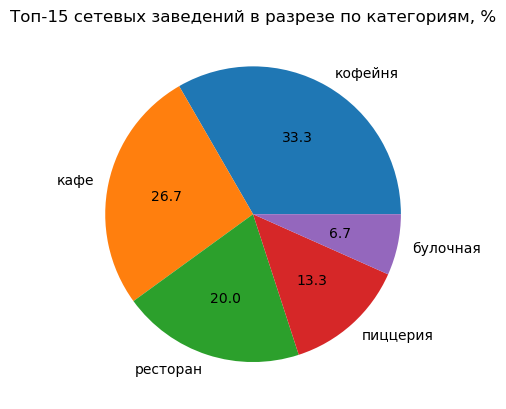

In [61]:
#круговая диаграмма с категориями топ-15
plt.pie(category_share['count'], labels=category_share['category'], autopct='%.1f')
plt.title('Топ-15 сетевых заведений в разрезе по категориям, %')
plt.show();

Среди сетевых заведеней чаще всего встречаются кофейни - треть от топ-15 сетевых заведений. На втором месте - кафе (чуть больше четверти). Сетевых заведений булочных меньше всего.

### Заведения на карте
#### Заведения по районам Москвы
Посмотрим какие административные районы Москвы присутствуют в датасете.

In [62]:
print('В датасете представлено', len(df['district'].unique()), 'районов Москвы.')

В датасете представлено 9 районов Москвы.


In [63]:
print('Перечень районов Москвы в датасете:')
df['district'].unique()

Перечень районов Москвы в датасете:


array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Определим общее количество заведений и количество заведений каждой категории по районам.

In [64]:
distr_by_cat = df.groupby(['district', 'category'], as_index=False).agg(count=('category', 'count'))

In [65]:
distr_by_cat['district'] = distr_by_cat['district'].apply(lambda x: re.sub(
                                                            pattern='административный округ', repl='АО', string=x))

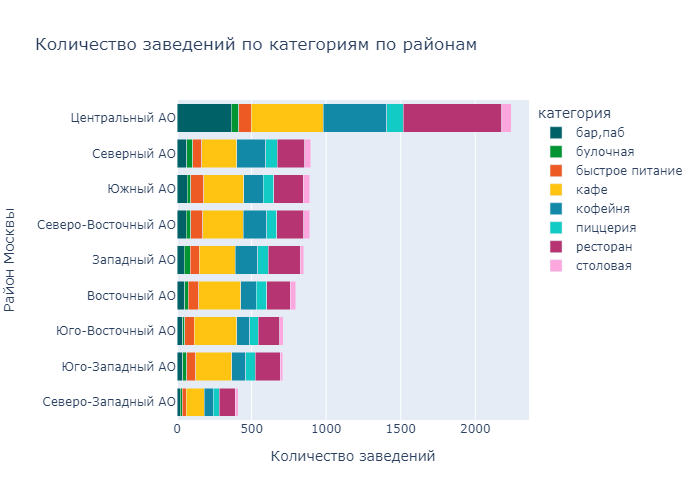

In [66]:
fig = px.bar(distr_by_cat, y='district', x='count', color='category', 
             title='Количество заведений по категориям по районам',
            labels={'district': 'Район Москвы', 'count': 'Количество заведений', 'category': 'категория'},
            color_discrete_sequence=['#006266',
  '#009432',
  '#EE5A24',
  '#FFC312',
  '#1289A7',
  '#12CBC4',
  '#B53471',
  '#FDA7DF'])
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})
fig.show('png')

<div style="border:solid blue 1px; padding: 10px"> Больше всего заведений расположено в ЦАО (более 2 тыс.), среди них наибольшую долю занимают рестораны, кафе и бары/пабы.

В САО, ЮАО и СВАО примерно одинаковое количество заведений, чуть меньше в ЗАО и ВАО - в каждом из этих районов количество заведений составляет порядка 700-800.
Меньше всего заведений в СЗАО - всего около 400.

По категории во всех районах кроме ЦАО преобладают кафе (в ЦАО лидируют рестораны, т.к. это наиболее престижный район, а значит и заведения будут более дорогими). Доля булочных и столовых в каждом из районов минимальна. </div>

#### Рейтинг

Для начала посмотрим как распределены рейтинги в целом по категориям заведений.

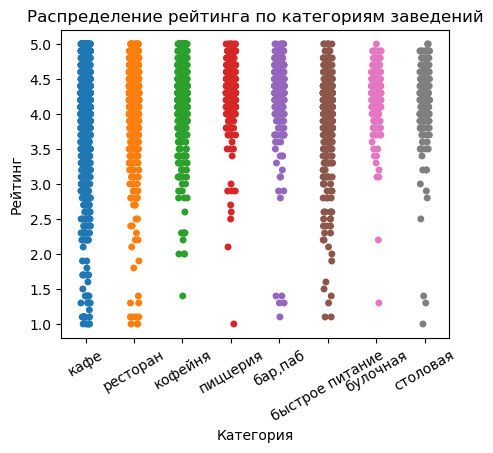

In [67]:
plt.figure(figsize=(5,4))
sns.stripplot(x='category', y='rating', data=df)
plt.title('Распределение рейтинга по категориям заведений')
plt.ylabel('Рейтинг')
plt.xlabel('Категория')
plt.xticks(rotation=30)
plt.show();

Большинство оценок рейтинга по каждой из категорий находятся в диапазоне от 3,5 до 5. При этом чаще всего низкие оценки получаются кафе. Низкие оценки также встречаются для быстрого питания и даже для ресторанов.  

Посмотрим на средние рейтинги по категориям.

In [68]:
category_rate = df.groupby('category', as_index=False)['rating'].mean()
category_rate['rating'] = round(category_rate['rating'], 2)
category_rate = category_rate.sort_values(by='rating', ascending=False)

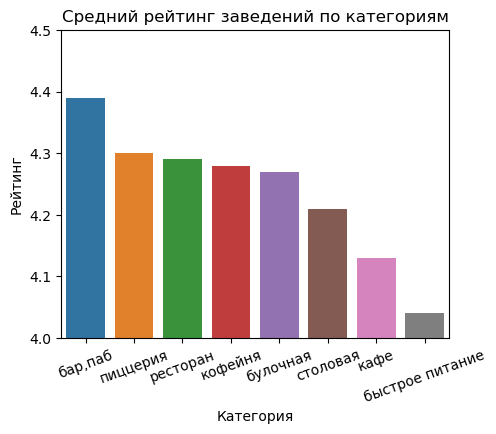

In [69]:
plt.figure(figsize=(5,4))
sns.barplot(data=category_rate, x='category', y='rating')
plt.title('Средний рейтинг заведений по категориям')
plt.ylabel('Рейтинг')
plt.xlabel('Категория')
plt.ylim(4, 4.5)
plt.xticks(rotation=20)
plt.show();

<div style="border:solid blue 1px; padding: 10px"> 

В целом у всех категорий достаточно приличный средний рейтинг (не ниже 4), но при этом разница между категориями невелика - разброс средних составляет менее 0,4 пунктов.

Наибольший средний рейтинг у баров/пабов можно объяснить хорошим расположением духа и настроением посетителей (алкоголь делает свое дело), которые приходят расслабиться и пообщаться и для которых вкус блюд мало имеет значение.
Самый низкий средний рейтинг у заведений быстрого питания - в таких местах чаще всего уделяют мало вниманию вкусу и качеству блюд. Предпоследнйи по величине средний рейтинг у кафе - на это повлияло большое количество низких оценок, т.к. качество от кафе к кафе может сильно отличаться. </div>

Построим визуализацию - как распределен средний рейтинг заведений по районам.

In [70]:
#считаем средний рейтинг категорий по районам
rating_mean = df.groupby(['district', 'category'], as_index=False)['rating'].mean() 

In [71]:
# загружаем датасет с границами районов Москвы
with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as file:
    state_geo = json.load(file)

In [72]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_mean,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.6,  #прозрачность
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

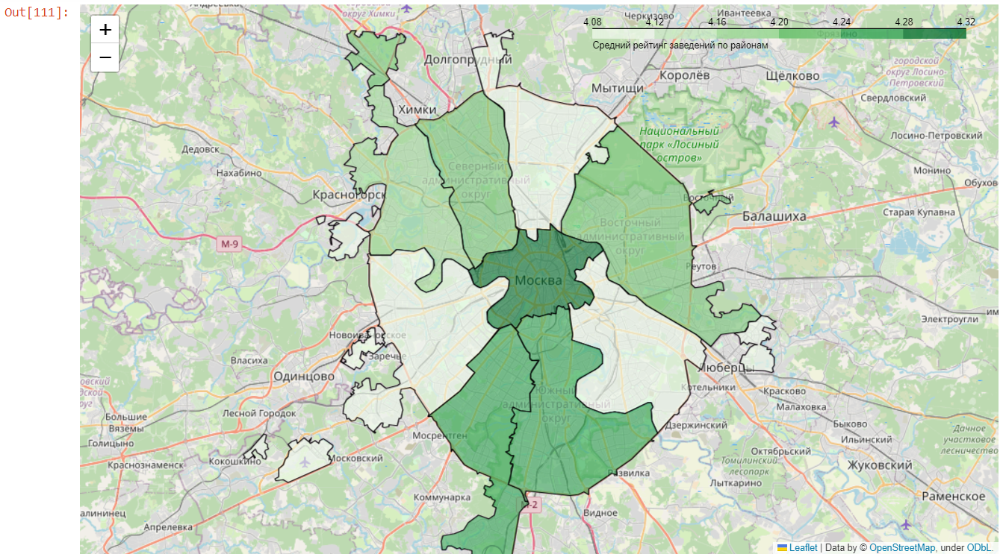

Наибольший средний рейтинг у заведений общепита, расположенных в ЦАО - это наиболее престижный район и в заведениях вероятно более тщательно следят за качеством блюд и уровнем сервиса. На втором месте ЮЗАО и ЮАО. 
Наименьшие средние рейтинги у заведений в СВАО, ЮВАО и ЗАО.

#### Все заведения на карте

In [73]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']]
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

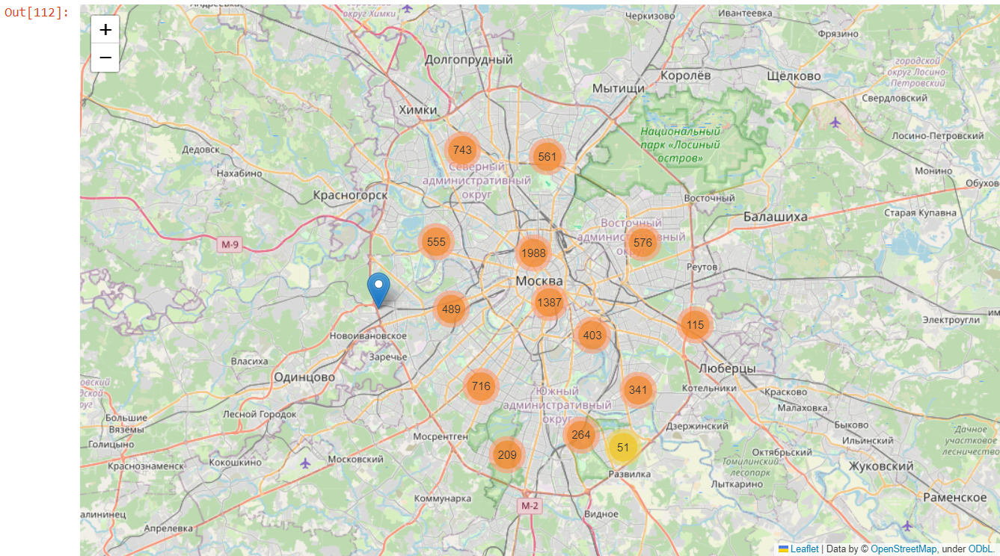

#### Топ-15 улиц по количеству заведений
Найдем топ-15 улиц по количеству заведений.

In [74]:
top_street = df['street'].value_counts().head(15)

Посмотрим количество заведений по категориям на каждой из топ-15 улиц.

In [75]:
cat_by_str = df.query('street in @top_street.index').groupby(['street', 'category'], 
                                                             as_index=False).agg(total=('category', 'count'))

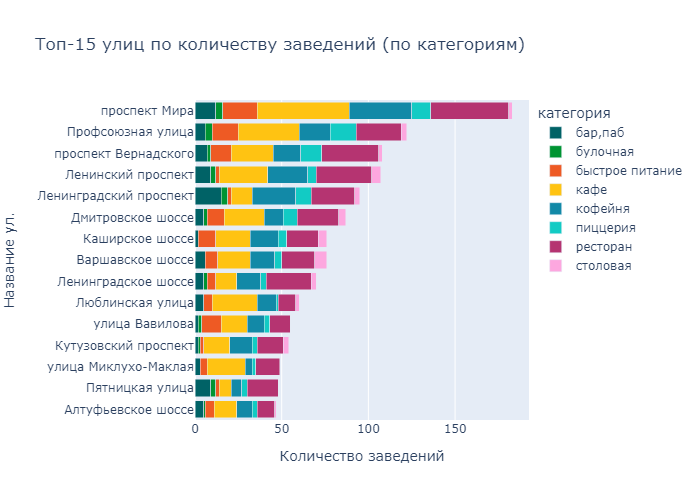

In [76]:
fig = px.bar(cat_by_str, y='street', x='total', color='category', 
       title='Топ-15 улиц по количеству заведений (по категориям)',
      labels={'street': 'Название ул.', 'total': 'Количество заведений', 'category': 'категория'},
            color_discrete_sequence=['#006266',
  '#009432',
  '#EE5A24',
  '#FFC312',
  '#1289A7',
  '#12CBC4',
  '#B53471',
  '#FDA7DF'])
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})
fig.show('png')

<div style="border:solid blue 1px; padding: 10px"> Среди топ-15 улиц абсолютным лидером по количеству заведений является проспект Мира (более 150 заведений, почти 200). Меньше всего - Алтуфьевское шоссе, Пятницкая улица и ул. Миклухо-Маклая (менее 50).

Количество заведений в первую очередь зависит от длинны улицы и вероятно связано с "проходимостью" улицы (т.е. на них должно быть много пешеходов). </div>

Теперь посмотрим. есть ли в датасете улицы, на которых находится только один объект общепита.

In [77]:
street_1 = df.groupby('street', as_index=False)['name'].count()
street_1 = street_1.query('name == 1')

In [78]:
street_1

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1457,улица Шкулёва,1
1458,улица Шкулёва 4,1
1460,улица Шухова,1
1463,улица Юннатов,1


Исправим пару ошибок.

In [79]:
df.query('street == "№ 7"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6303,енот,кафе,"Москва, № 7",Южный административный округ,неизвестно,55.679064,37.615015,4.8,NaN,NaN,NaN,NaN,0,NaN,№ 7,False


In [80]:
df.loc[df['street'] == 'улица Шкулёва 4', 'street'] = 'улица Шкулёва'
df = df.drop([6303]).reset_index(drop=True)

In [81]:
street_1 = df.groupby('street', as_index=False)['name'].count()
street_1 = street_1.query('name == 1')
street_1

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1442,улица Фотиевой,1
1453,улица Чечулина,1
1454,улица Чистова,1
1459,улица Шухова,1


In [82]:
street_names = street_1['street']

In [83]:
str_1 = df.query('street in @street_names')

In [84]:
print(f'Удалось найти {len(str_1)} улиц, на которых расположено только одно заведение общественного питания')
print('Всего в датасете', len(df['street'].unique()), 'улиц')
print('Доля улиц с одним заведением от всех в датасете составляет', 
      round(100*len(str_1)/len(df['street'].unique())), '%')

Удалось найти 466 улиц, на которых расположено только одно заведение общественного питания
Всего в датасете 1467 улиц
Доля улиц с одним заведением от всех в датасете составляет 32 %


In [85]:
display(str_1['district'].unique())
str_1['category'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Западный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

array(['кафе', 'столовая', 'кофейня', 'ресторан', 'бар,паб',
       'быстрое питание', 'пиццерия', 'булочная'], dtype=object)

In [86]:
str_1.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,466.0,55.759820,0.065405,55.578830,55.728401,55.760801,55.795939,55.914074
lng,466.0,37.615772,0.096245,37.387459,37.559539,37.611885,37.667302,37.867004
rating,466.0,4.229614,0.459011,1.000000,4.100000,4.300000,4.475000,5.000000
middle_avg_bill,167.0,953.305389,995.299160,67.000000,325.000000,625.000000,1250.000000,7000.000000
middle_coffee_cup,24.0,186.166667,55.544472,95.000000,140.000000,177.500000,213.750000,320.000000
chain,466.0,0.298283,0.457996,0.000000,0.000000,0.000000,1.000000,1.000000
seats,155.0,58.916129,48.366962,0.000000,30.000000,45.000000,80.000000,240.000000


<div style="border:solid blue 1px; padding: 10px"> 

Улицы с 1 заведением общепита встречаются в каждом из районов Москвы, среди заведений предствлены все 8 категорий (от столовых до ресторанов). Сердний рейтинг таких "одиночных" заведений составляет 4,2 - что близко к среднему рейтингу по всем категориям. 
    
Данных о среднем счете и средней цене чашки кофе мало (более 60% пропусков), но тем не менее медианный чек всего 625 руб (среднее значение искажено в большую сторону из-за нескольких больших значений порядка 7000 руб). Медианная (и средняя) цена чашки кофе составляет 170-190 руб. Большинство заведения, по которым имеются ценовые данные можно отнести к средней ценовой категории. 
</div>

#### Средний чек по районам
Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района и построим хороплет.

In [87]:
bill_by_distr = df.query('middle_avg_bill != "NaN"').groupby('district', as_index=False).agg({'middle_avg_bill': 'median'})

In [88]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill_by_distr,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.6,  #прозрачность
    legend_name='Медианный средний чек заведений по районам, руб',
).add_to(m)

m

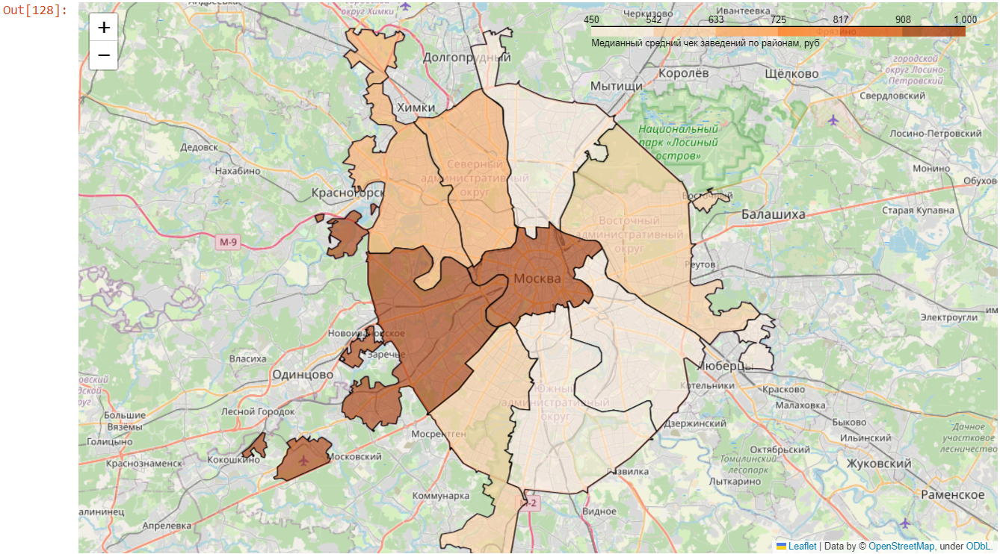

<div style="border:solid blue 1px; padding: 10px"> По логике средний чек в заведения должен уменьшаться с отдалением от центра - на фоновой картограмме с разбивкой по административным окугам Москвы это не сильно наглядно, можно было бы выделить зоны (концентрические круги), которые бы позволили это проанализировать.

Имея медианные значения по округа можно сделать вывод только о престижности того или иного округа. Наибольший медианный средний чек (от 900 до 1000 руб) у заведений, расположенных в ЦАО и ЗАО, которые являются наиболее престижными и элитными районами (на западе МГУ и рублёвка). Далее идут СЗАО и САО (~600-700 руб). Округа с самым дешевым медианным средним чеком по заведениям (450 - 550 руб) - это северо-запад, юго-запад и юг. 

Из такого распределения можно сделать вывод, что более дорогие, статусные заведения стоит открывать в центре или на западе, т.к. скорее всего такой формат будет более приемлем и ожидаем (в плане ценовой категории и уровня) для жителей этих районов, а значит спрос будет лучше. 

Заведения со средней ценовой категорией можно в целом открывать в любом районе - на них в любом случае будет спрос и найдется соответствующий тип клиентов. </div>

**ОБЩИЙ ВЫВОД**
<div style="border:solid blue 2px; padding: 10px"> 

В Москве больше всего заведений категории кафе (около 2,5 тыс.). На втором месте по количеству - рестораны (~ 2 тыс.); на третьем - кофейни (менее 1,5 тыс.). У таких категорий заведений наибольший уровень конкуренции, но при этом и больше разнообразия при выборе кухни и меню (пиццерии ограничены только пиццей, а в барах и пабах больше упор на напитки). Меньше всего представлено булочных и столовых (около 250 в каждой из категорий).

Чаще всего заведения рассчитаны на 50-100 посадочных мест и не являются сетевыми. Среди сетевых заведений чаще встречаются кофейни, булочные и пиццерии. При этом среди топовых (по количеству заведений) сетей больше всего кофеен. Это стоит учесть при выборе формата нового места, т.к. конкурировать с большими известными сетями сложнее. 

Больше всего заведений расположено в ЦАО (более 2 тыс.), что определяет наиболее конкурентную среду в этом округе. Среди них наибольшую долю занимают рестораны, кафе и бары/пабы. В САО, ЮАО и СВАО примерно одинаковое количество заведений, чуть меньше в ЗАО и ВАО - в каждом из этих районов количество заведений составляет порядка 700-800. Меньше всего заведений в СЗАО - всего около 400.
    
По категории во всех районах кроме ЦАО преобладают кафе (в ЦАО лидируют рестораны, т.к. это наиболее престижный район, а значит и заведения будут более дорогими). Также в каждом из районов представлено достаточно много кофеен. Доля булочных и столовых в каждом из районов минимальна.

В целом средний рейтинг для всех категорий не ниже 4, но при этом разница между категориями невелика - разброс средних составляет менее 0,4 пунктов. Наибольший средний рейтинг у баров/пабов, далее - пиццерии, кофейни, рестораны и булочные. Кафе чаще остальных категорий получают низкие оценки.

Среди топ-15 улиц абсолютным лидером по количеству заведений является проспект Мира (более 150 заведений, почти 200). Меньше всего - Алтуфьевское шоссе, Пятницкая улица и ул. Миклухо-Маклая (менее 50). Количество заведений в первую очередь зависит от длинны улицы и вероятно связано с "проходимостью" улицы (т.е. на них должно быть много пешеходов)
    
Судя по распределению медианного среднего чека по районам, более дорогие, статусные заведения стоит открывать в центре или на западе, т.к. скорее всего такой формат будет более приемлем и ожидаем (в плане ценовой категории и уровня) для жителей этих районов, а значит спрос будет лучше. Заведения со средней ценовой категорией можно в целом открывать в любом районе - на них в любом случае будет спрос и найдется соответствующий тип клиентов.
</div>

## Детализация. Открытие кофейни

Заказчик рассматривает возможность открытия собственной кофейни в Москвы. Проанализируем имеющиеся данные по кофейням в Москве, чтобы сформировать рекомендации заказчику по открытию нового заведения такого типа.

### Расположение
Для начала посмотрим сколько всего кофеен представлено в датасете и как они распределены по районам Москвы.

In [89]:
cofeyni = df.query('category == "кофейня"')
f'Всего кофеен в датасете: {len(cofeyni)}'

'Всего кофеен в датасете: 1407'

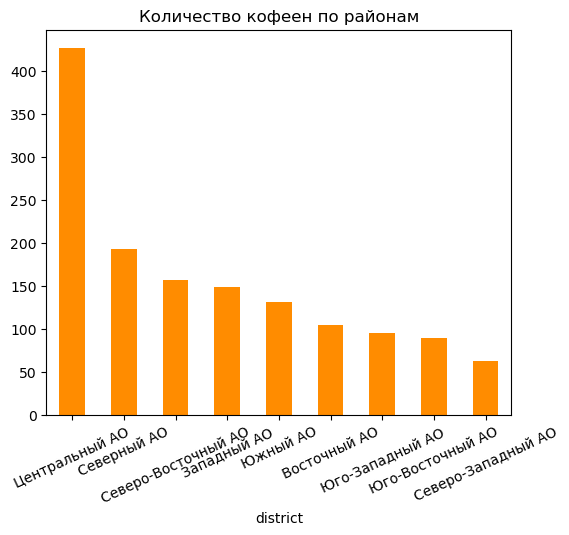

In [90]:
cof_count = cofeyni.groupby('district', as_index=False).agg({'name': 'count'}).sort_values(by='name', ascending=False)
cof_count['district'] = cof_count['district'].apply(lambda x: re.sub(
                                                            pattern='административный округ',
                                                            repl='АО', 
                                                            string=x))

cof_count.plot(kind='bar', x='district', y='name', color='darkorange', legend=False, figsize=(6,5))
plt.title('Количество кофеен по районам')
plt.xticks(rotation=25)
plt.show();

Больше всего кофеен в Центральном округе - более 400. На втором месте Северный округ, но отрыв большой - на севере коффен уже в 2 раза меньше, чем в центре. Кофейни также популярны на западе и северо-востоке.

Меньше всего кофеен (а значит и меньше конкуренция) в СЗАО, ЮЗАО, ЮВАО.

Посмотрим как кофейни расположены на карте и попробуем выявить какие-либо закономерности в расположении. Предварительно можно предположить, что кофейни будут чаще распологаться вблизи метро, бизнес-центров и, возможно, торговых центров - кофе чаще всего пьют утром, по пути на работу или перед началом рабочего дня.

In [91]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']]
    ).add_to(marker_cluster)

cofeyni.apply(create_clusters, axis=1)

m

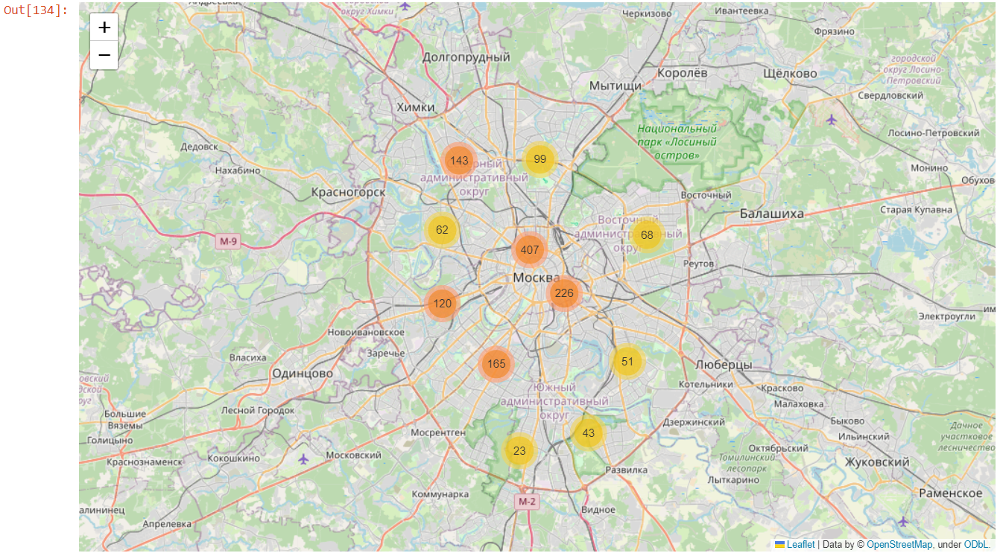

БЦ и ТЦ на карте не отмечены, но зато можно наблюдать скопления кофеен вблизи станций метро, особенно это заметно в центре. Можно считать, что предположения подтвердились.

Посмотрим на каких улицах расположено больше всего кофееен (открывать новое заведения на этих улицах вряд ли стоит ввиду большой конкуренции).

In [92]:
cofeyni['street'].value_counts().head(15)

проспект Мира             36
Ленинградский проспект    25
Ленинский проспект        23
Профсоюзная улица         18
Каширское шоссе           16
проспект Вернадского      16
Варшавское шоссе          14
Ленинградское шоссе       14
Кутузовский проспект      13
Новодмитровская улица     12
Новослободская улица      12
Люблинская улица          11
Дмитровское шоссе         11
улица Вавилова            10
Алтуфьевское шоссе         9
Name: street, dtype: int64

### Режим работы и формат заведения
Чтобы определить режим работы нового заведения, посмотрим есть ли кофейни, которые работают ежедневно и круглосуточно.

In [93]:
print('Количество кофеен, которые работают ежедневно и круглосуточно:', len(cofeyni[cofeyni['is_24/7'] == True]))
print('Доля круглосуточных кофеен составляет', 
      round(100*len(cofeyni[cofeyni['is_24/7'] == True])/len(cofeyni)),
     '%')

Количество кофеен, которые работают ежедневно и круглосуточно: 59
Доля круглосуточных кофеен составляет 4 %


Круглосуточных кофеен крайне мало, что значит, что такой формат работы кофеен не пользуется популярностью. Рекомендуется выбрать стандартный режим работы.

Посмотрим сколько посадочных мест обычно в кофейнях, чтобы оценить формат заведения (только на вынос или с посадкой, количество мест).

In [94]:
cofeyni['seats'].describe()

count    748.000000
mean     107.168449
std      107.367307
min        0.000000
25%       40.000000
50%       80.000000
75%      144.000000
max      650.000000
Name: seats, dtype: float64

Кофеен без посадочных мест меньше четверти от всех заведений, значит более популярны кофейни, где можно посидеть. Среднее количество мест в кофейнях Москвы - 107, в то время как медианное значение составляет 80, что обусловлено наличием очень больших значений, искажающих среднее. 

Открывать новую кофейню сразу с большим залом для посетителей может быть невыгодно, т.к. по началу не стоит расчитывать на большой поток посетителей (малоизвестное место). Но также не рекомендуется открывать очень маленькую кофейню: меньше посетителей = меньше прибыли. Стоит ориентироваться на медианное значение (т.к. среднее искажено) или даже немного меньшее значение.

### Рейтинг 
Посмотрим на рейтинг кофеен.

In [95]:
cofeyni['rating'].describe()

count    1407.000000
mean        4.276901
std         0.372489
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Все кофейни из датасета имеют рейтинг. Рейтинг коффен распределен в диапазоне от 1,4 до 5. Средний рейтинг составляет 4,27 и практически равен медианному рейтингу (4,3), т.е. отстутсвуют выбросы, которые могли бы исказить среднее.
Только четверть коффен имеют рейтинг ниже 4,1.

Посмотрим как средний и медианный рейтинги распределены по округам.

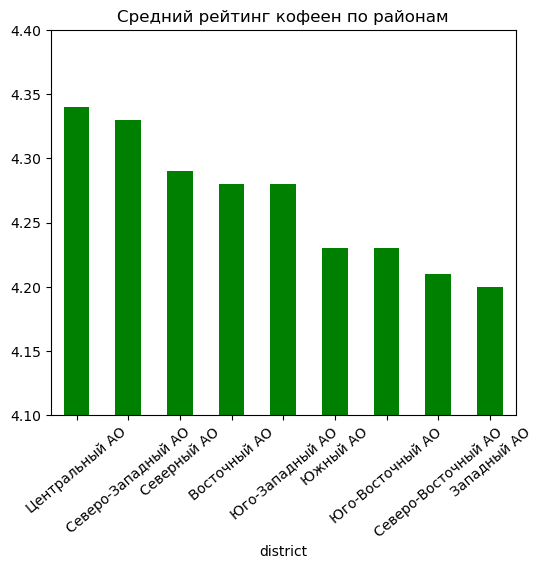

In [96]:
mean_rate_cof = cofeyni.groupby('district', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False)
mean_rate_cof['rating'] = round(mean_rate_cof['rating'], 2)
mean_rate_cof['district'] = mean_rate_cof['district'].apply(lambda x: re.sub(
                                                            pattern='административный округ',
                                                            repl='АО',
                                                            string=x))
mean_rate_cof.plot(kind='bar', x='district', y='rating', color='green', legend=False, figsize=(6,5))
plt.ylim(4.1, 4.4)
plt.title('Средний рейтинг кофеен по районам')
plt.xticks(rotation=40)
plt.show();

Ожидаемо лучший средний рейтинг в центральном округе. Худшие в СВАО и ЗАО.

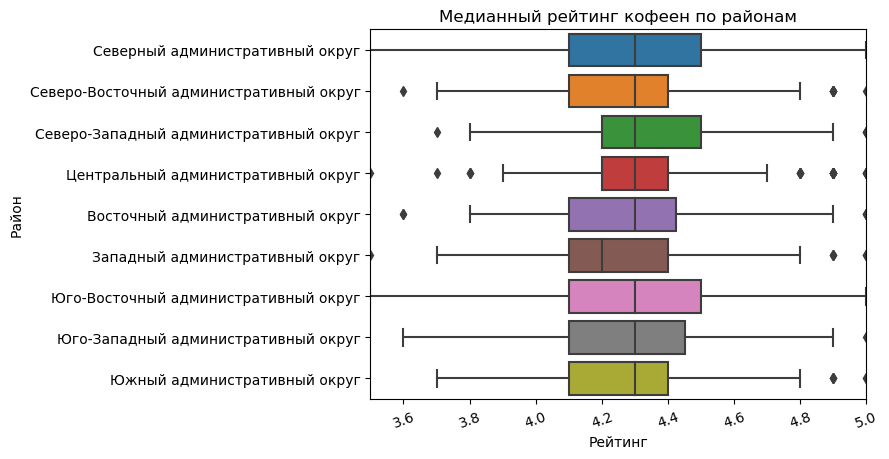

In [97]:
sns.boxplot(data=cofeyni, y='district', x='rating')
plt.title('Медианный рейтинг кофеен по районам')
plt.ylabel('Район')
plt.xlabel('Рейтинг')
plt.xticks(rotation=20)
plt.xlim(3.5, 5)
plt.show();

Любопытно, что медианные рейтинг для всех округов одинаковы и составляют 4.3, кроме западного - в нем медианный рейтинг на 0.1 пункт ниже.

Предлагается выбирать район, где рейтинг кофеен хуже, чтобы "выиграть" на контрасте с некачественными заведениями. По среднему и медианному значению район с наиболее низким рейтингом кофеен определяется однозначно - ЗАО.

### Цена чашки кофе
Определим на какую цену чашки кофе ориентироваться при открытии нового заведения. Посмотрим как распределены цены по кофейням.

In [98]:
cofeyni['middle_coffee_cup'].describe()

count    521.000000
mean     172.545106
std       65.816633
min       60.000000
25%      124.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Менее половины кофеен из датасета имеют информацию о цене чашки кофе.

По имеющимся данным цена чашки кофе находится в диапазоне от 60 до 375 руб, средняя цена составляет ~170 руб. (практически не отличается от медианной, т.е. выбросов, искажающих среднее нет). Посмотрим как распределены цены по районам.

In [99]:
coffee_price = cofeyni.groupby('district', as_index=False).agg(
    {'middle_coffee_cup': ['min', 'mean', 'max']}
).sort_values(by=('middle_coffee_cup', 'mean'), ascending=False)

coffee_price[('middle_coffee_cup', 'mean')] = round(coffee_price[('middle_coffee_cup', 'mean')])

In [100]:
coffee_price

district middle_coffee_cup              
                                                         min   mean    max
1          Западный административный округ              60.0  190.0  300.0
5       Центральный административный округ              60.0  188.0  328.0
7      Юго-Западный административный округ              95.0  184.0  291.0
2          Северный административный округ              60.0  166.0  325.0
4   Северо-Западный административный округ              60.0  166.0  270.0
3  Северо-Восточный административный округ              60.0  165.0  297.0
8             Южный административный округ              60.0  158.0  275.0
6     Юго-Восточный административный округ              60.0  151.0  375.0
0         Восточный административный округ              60.0  143.0  260.0

Стоит ориентироваться на среднее значение по всем районам (т.е. 170 руб за чашку), но при этом можно уточнить цену исходя из выбранного района для расположения района (средняя цена в зависимости от района может быть от 140 до 190 руб).

### Рекомендации по открытию кофейни
<div style="border:solid blue 1px; padding: 10px">

**Расположение:**
- Не рекомендуется выбирать Центральный округ (больше всего кофеен, а значит высокая конкуренция). Стоит обратить внимание на СЗАО, ЮЗАО, ЮВАО - в этих районах расположено меньше всего кофеен, менее 100 в каждом.
- альтернативно можно сделать выбор на основе рейтинга кофеен по районам, худшие по рейтингу кофейни расположены в ЗАО, если есть уверенность, то возможно "сыграть на контрасте" с существующими заведениями. В этом плане, кроме ЗАО, также можно обратить внимание на ЮВАО;
- кофейню рекомендуется располагать вблизи метро, скоплений бизнес-центров и торговых центров - кофе чаще всего пьют утром, по пути на работу или перед началом рабочего дня:
- рекомендуется выбирать улицу, на которой расположено немного кофеен, но при этом трафик пешеходов на улице должен быть оживленный.
    
**Формат и режим работы:**
- кофеен без посадочных мест меньше четверти от всех заведений, значит более популярны кофейни, где можно посидеть. Открывать новую кофейню сразу с большим залом для посетителей может быть невыгодно, т.к. по началу не стоит расчитывать на большой поток посетителей (малоизвестное место). Но также не рекомендуется открывать очень маленькую кофейню: меньше посетителей = меньше прибыли. Стоит выбирать зал на 60-80 посадочных мест.
- круглосуточных кофеен крайне мало, что значит, что такой формат работы кофеен не пользуется популярностью. Рекомендуется выбрать стандартный режим работы (например, с 8:00 до 19:00).
    
**Цена чашки кофе:**
- цена чашки кофе находится в диапазоне от 60 до 375 руб, средняя цена составляет ~170 руб.
- для уточнения цены рекомендуется ориентироваться на средние цены в кофейнях того района, который выбран для открытия нового заведения. Средняя цена в зависимости от района может быть от 140 до 190 руб.

</div>